In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import os
import pandas as pd

import bin2cell as b2c

#create directory for stardist input/output files
os.makedirs("stardist", exist_ok=True)

/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


### Segmentation

In [ ]:
import bin2cell as b2c

In [ ]:
basedir = '/ix/djishnu/shared/djishnu_kor11/raw_data/mouse_lymph_visiumHD'

## Control
# path = f"{basedir}/SpaceRanger_OUT_extra/Co_LNs/binned_outputs/square_002um"
# source_image_path = f"{basedir}/Visium_images/CtrlLNs.tif"
# spaceranger_image_path = f"{basedir}/SpaceRanger_OUT_extra/Co_LNs/spatial"

# Ccr4 KO
path = f"{basedir}/SpaceRanger_OUT_extra/CCL4_LNs/binned_outputs/square_002um"
source_image_path = f"{basedir}/Visium_images/CCL4LNs.tif"
spaceranger_image_path = f"{basedir}/SpaceRanger_OUT_extra/CCL4_LNs/spatial"


In [ ]:
adata = b2c.read_visium(path, 
                        source_image_path = source_image_path, 
                        spaceranger_image_path = spaceranger_image_path
                       )
adata.var_names_make_unique()

In [ ]:
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata, min_counts=1)
adata

In [5]:
mpp = 0.3

b2c.scaled_he_image(adata, mpp=mpp, save_path="stardist/he_KO.tiff")

Cropped spatial coordinates key: spatial_cropped_150_buffer
Image key: 0.3_mpp_150_buffer


In [6]:
b2c.destripe(adata)

_construct.py (148): Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


In [7]:
# plt.scatter(adata.obs['array_row'], adata.obs['array_col'], c=adata.obs['n_counts'], cmap='OrRd')

In [8]:
#define a mask to easily pull out this region of the object in the future
mask = ((adata.obs['array_row'] >= 1000) & 
        (adata.obs['array_row'] <= 1100) & 
        (adata.obs['array_col'] >= 1000) & 
        (adata.obs['array_col'] <= 1100)
       )

bdata = adata[mask]
bdata

View of AnnData object with n_obs × n_vars = 10199 × 19020
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'destripe_factor', 'n_counts_adjusted'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

anndata.py (1209): Trying to modify attribute `.var` of view, initializing view as actual.
anndata.py (1209): Trying to modify attribute `.var` of view, initializing view as actual.


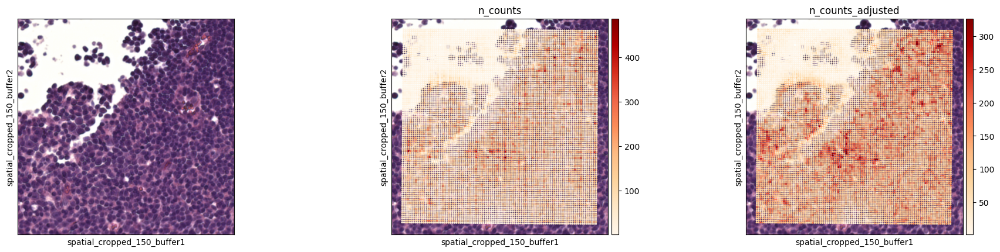

In [9]:
sc.pl.spatial(bdata, color=[None, "n_counts", "n_counts_adjusted"], 
              color_map="OrRd",
              img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer"
      )

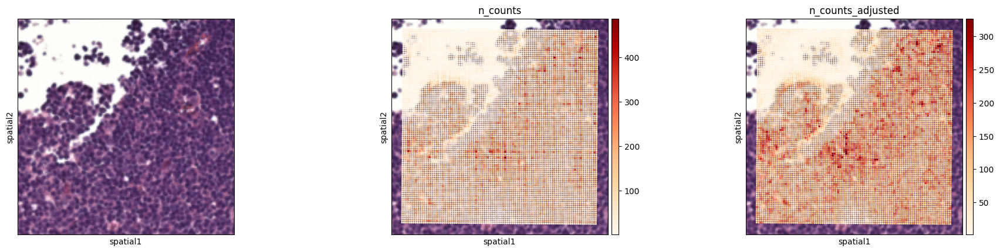

In [10]:
sc.pl.spatial(bdata, color=[None, "n_counts", "n_counts_adjusted"], color_map="OrRd")

In [11]:
b2c.stardist(image_path="stardist/he_KO.tiff", 
             labels_npz_path="stardist/he_KO.npz", 
             stardist_model="2D_versatile_he", 
             prob_thresh=0.01
            )

2025-06-08 15:17:54.864422: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-06-08 15:17:55.417333: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ix3/djishnu/alw399/envs/sheep/lib/python3.9/site-packages/cv2/../../lib64:/ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/sodium/1.0.18/lib:/ihome/crc/install/gcc-12.2.0/

Found model '2D_versatile_he' for 'StarDist2D'.


2025-06-08 15:19:18.526531: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ix3/djishnu/alw399/envs/sheep/lib/python3.9/site-packages/cv2/../../lib64:/ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/sodium/1.0.18/lib:/ihome/crc/install/gcc-12.2.0/r/4.4.0/lib64/R/lib:/ihome/crc/install/gcc-12.2.0/openmpi/4.1.5/lib:/ihome/crc/install/gcc-12.2.0/fftw/3.3.10/lib:/ihome/crc/install/gcc-12.2.0/glpk/5.0/lib:/ihome/crc/install/gcc-12.2.0/proj/4.9.3/lib:/ihome/crc/install/gcc-12.2.0/gdal/2.4.4/lib:/ihome/crc/install/gcc-12.2.0/netcdf/4.8.1/lib:/ihome/crc/install/gcc-12.2.0/hdf5/1.14.0/lib:/ihome/crc/install/gcc

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|██████████| 42/42 [10:32<00:00, 15.06s/it]


Found 388277 objects


In [12]:
b2c.insert_labels(adata, 
                  labels_npz_path="stardist/he_KO.npz", 
                  basis="spatial", 
                  spatial_key="spatial_cropped_150_buffer",
                  mpp=mpp, 
                  labels_key="labels_he"
                 )

4204209659.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


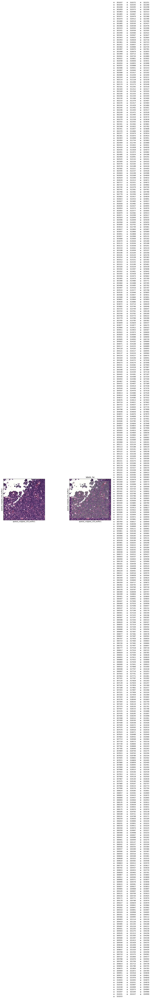

In [13]:
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_he']>0]
bdata.obs['labels_he'] = bdata.obs['labels_he'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_he"], img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer")

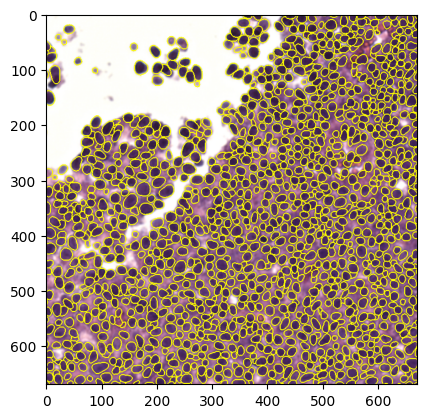

In [14]:
#the label viewer wants a crop of the processed image
#get the corresponding coordinates spanning the subset object
crop = b2c.get_crop(bdata, basis="spatial", spatial_key="spatial_cropped_150_buffer", mpp=mpp)

rendered = b2c.view_labels(image_path="stardist/he_KO.tiff", 
                           labels_npz_path="stardist/he_KO.npz", 
                           crop=crop
                          )
plt.imshow(rendered)

In [15]:
b2c.expand_labels(adata, 
                  labels_key='labels_he', 
                  expanded_labels_key="labels_he_expanded"
                 )

2208659422.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


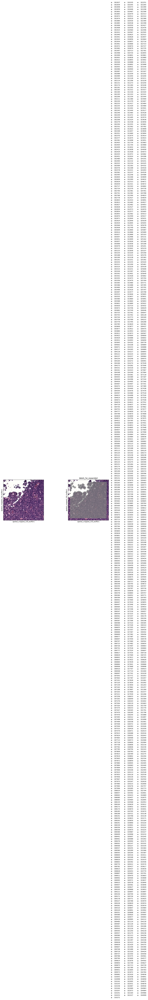

In [16]:
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_he_expanded']>0]
bdata.obs['labels_he_expanded'] = bdata.obs['labels_he_expanded'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_he_expanded"], img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer")

In [17]:
b2c.grid_image(adata, "n_counts_adjusted", mpp=mpp, sigma=5, save_path="stardist/gex_KO.tiff")

In [19]:
b2c.stardist(image_path="stardist/gex_KO.tiff", 
             labels_npz_path="stardist/gex_KO.npz", 
             stardist_model="2D_versatile_fluo", 
             prob_thresh=0.05, 
             nms_thresh=0.5
            )

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
effective: block_size=(4096, 4096), min_overlap=(128, 128), context=(128, 128)


100%|██████████| 36/36 [08:08<00:00, 13.57s/it]


Found 110547 objects


In [20]:
b2c.insert_labels(adata, 
                  labels_npz_path="stardist/gex_KO.npz", 
                  basis="array", 
                  mpp=mpp, 
                  labels_key="labels_gex"
                 )

3087949908.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


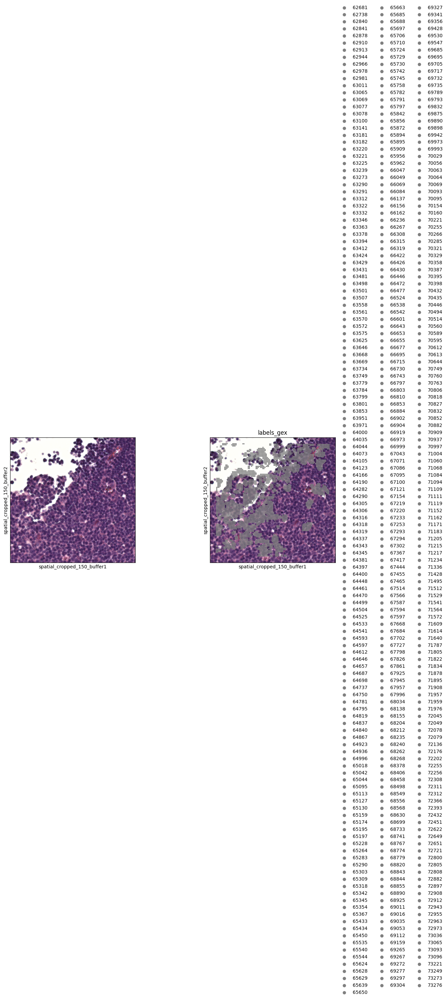

In [21]:
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_gex']>0]
bdata.obs['labels_gex'] = bdata.obs['labels_gex'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_gex"], img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer")

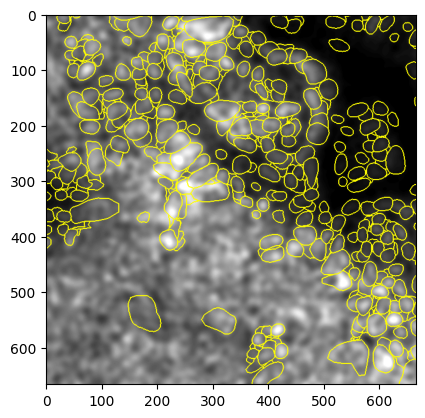

In [22]:
#the label viewer wants a crop of the processed image
#get the corresponding coordinates spanning the subset object
crop = b2c.get_crop(bdata, basis="array", mpp=mpp)

#GEX pops better with percentile normalisation performed
rendered = b2c.view_labels(image_path="stardist/gex_KO.tiff", 
                           labels_npz_path="stardist/gex_KO.npz", 
                           crop=crop,
                           stardist_normalize=True
                          )
plt.imshow(rendered)

In [23]:
b2c.salvage_secondary_labels(adata, 
                             primary_label="labels_he_expanded", 
                             secondary_label="labels_gex", 
                             labels_key="object_id"
                            )

Salvaged 6720 secondary labels


2428170469.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


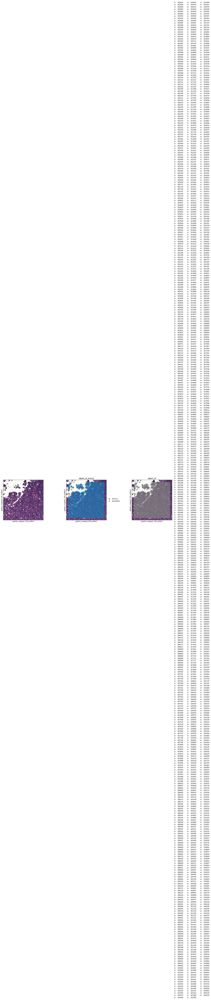

In [24]:
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['object_id']>0]
bdata.obs['object_id'] = bdata.obs['object_id'].astype(str)

sc.pl.spatial(bdata, color=[None, "object_id_source", "object_id"], 
              img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer")

In [25]:
cdata = b2c.bin_to_cell(adata, labels_key="object_id", spatial_keys=["spatial", "spatial_cropped_150_buffer"])
cdata

AnnData object with n_obs × n_vars = 391477 × 19020
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'object_id_source'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

In [26]:
# Save all AnnData objects to disk
adata.write_h5ad('stardist/adata_KO.h5ad')
bdata.write_h5ad('stardist/bdata_KO.h5ad') 
cdata.write_h5ad('stardist/cdata_KO.h5ad')

### Group spots by cells

In [3]:
adata_st = sc.read_h5ad('stardist/cdata_KO.h5ad')
adata_st

AnnData object with n_obs × n_vars = 391477 × 19020
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'object_id_source'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

In [4]:
len(adata_st.obs['object_id'].unique())

391477

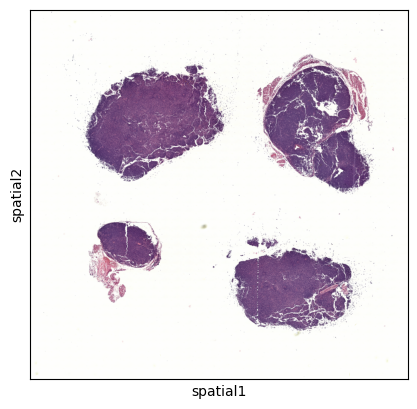

In [5]:
sc.pl.spatial(adata_st, spot_size=10)

In [6]:
coords = adata_st.obsm['spatial']
coords = pd.DataFrame(coords, columns = ['x', 'y'], index=adata_st.obs.index)
coords['object_id'] = adata_st.obs['object_id']

coords = coords.groupby('object_id').mean()
coords.head()

,x,y
object_id,,
1,2849.110162,3289.271873
9,3735.238457,3950.511333
11,3543.084190,2282.700950
14,3526.504612,2278.877615
15,3684.516400,3751.047362


In [7]:
gex_df = adata_st.to_df(layer=None)
adata_st.X.min(), adata_st.X.max()

(0.0, 2950.855972851633)

In [8]:
gex_df['object_id'] = adata_st.obs['object_id']

In [9]:
gex_df.head(3)

,Xkr4,Rp1,Sox17,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,Rb1cc1,...,mt-Atp6,mt-Co3,mt-Nd3,mt-Nd4l,mt-Nd4,mt-Nd5,mt-Nd6,mt-Cytb,Vamp7,object_id
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,1
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.92167,0.0,0.0,0.0,2.078658,0.0,9
11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,11


In [ ]:
import gc
del adata_st
gc.collect()

393722

In [ ]:
gex_df = gex_df.groupby('object_id').sum()
gex_df

In [10]:
# load from file after submitting as job

# gex_df = pd.read_parquet('cdata_gex.parquet')
# coords = pd.read_parquet('cdata_coords.parquet')
gex_df = pd.read_parquet('cdata_KO_gex.parquet')
coords = pd.read_parquet('cdata_KO_coords.parquet')


gex_df.head(3)
coords.head(3)

: 

: 

In [ ]:
adata_st = sc.AnnData(
    X = gex_df.values,
    var = pd.DataFrame(index = gex_df.columns),
    obs = pd.DataFrame(index = gex_df.index),
    obsm = {'spatial': coords.reindex(gex_df.index, axis=0).values}
)

adata_st

In [ ]:
plt.scatter(coords['x'], coords['y'], s=1, alpha=0.5)
plt.gca().set_aspect('equal')

In [1]:
import numpy as np
import easydict

# data = np.load(f'control_shapes.npz')

# shape_3 = easydict.EasyDict({'data': data['shape_3']})
# shape_2 = easydict.EasyDict({'data': data['shape_2']})
# shape_1 = easydict.EasyDict({'data': data['shape_1']})

In [2]:
data = np.load(f'KO_shapes.npz')

shape_4 = easydict.EasyDict({'data': data['shape_4']})
shape_3 = easydict.EasyDict({'data': data['shape_3']})
shape_2 = easydict.EasyDict({'data': data['shape_2']})
shape_1 = easydict.EasyDict({'data': data['shape_1']})

In [ ]:
from shapely.geometry import Point, Polygon

def points_in_polygon(polygon_coords, points):
    polygon = Polygon(polygon_coords)
    return np.array([pt for pt in points if polygon.contains(Point(pt))])

adata_coords = {}
coords = adata_st.obsm['spatial']

# data = [shape_1.data, shape_2.data, shape_3.data]
adata = [shape_1.data, shape_2.data, shape_3.data, shape_4.adata]

for i, polygon_coords in enumerate(data):
    selected_points = points_in_polygon(polygon_coords[0], coords)
    adata_coords[i+1] = selected_points

In [ ]:
# takes around 10 min

cell_lookup = pd.DataFrame(
    adata_st.obs_names, index=[f'{x}_{y}'for x, y in adata_st.obsm['spatial']])

adata_1_coords = [f'{x}_{y}' for x, y in adata_coords[1]]
adata_2_coords = [f'{x}_{y}' for x, y in adata_coords[2]]
adata_3_coords = [f'{x}_{y}' for x, y in adata_coords[3]]

adata_1 = adata_st[cell_lookup.loc[adata_1_coords].values.flatten(), :].copy()
adata_2 = adata_st[cell_lookup.loc[adata_2_coords].values.flatten(), :].copy()
adata_3 = adata_st[cell_lookup.loc[adata_3_coords].values.flatten(), :].copy()

In [ ]:
adata_4_coords = [f'{x}_{y}' for x, y in adata_coords[4]]
adata_4 = adata_st[cell_lookup.loc[adata_4_coords].values.flatten(), :].copy()


In [ ]:
fig, ax = plt.subplots(figsize=(5,5))
# for sample,adata in enumerate([adata_1, adata_2, adata_3]):
for sample,adata in enumerate([adata_1, adata_2, adata_3, adata_4]):
    ax.scatter(
        adata.obsm['spatial'][:, 0], 
        adata.obsm['spatial'][:, 1],
        s=20, alpha=0.5, label=sample)
plt.legend()

In [ ]:
import sys
sys.path.append('../../src')
from spaceoracle.tools.utils import scale_adata

adata_1 = scale_adata(adata_1, cell_size=10)
adata_2 = scale_adata(adata_2, cell_size=10)
adata_3 = scale_adata(adata_3, cell_size=10)

adata_4 = scale_adata(adata_4, cell_size=10)


In [ ]:
tmp_dir = '/ix3/djishnu/alw399/SpaceOracle/data/visiumHD_lymph'

adata_1.write_h5ad(f'{tmp_dir}/KO_adata_1.h5ad')
adata_2.write_h5ad(f'{tmp_dir}/KO_adata_2.h5ad')
adata_3.write_h5ad(f'{tmp_dir}/KO_adata_3.h5ad')

adata_4.write_h5ad(f'{tmp_dir}/KO_adata_4.h5ad')


In [ ]:
# slideseq = '/ix/djishnu/Yijia/project_asthma_lung/1_slide_tcr_seq/data/slideTCR_asthma_lymphnode_tangramAnno_wTCR_wRegion_w1DERCT_sample1_test.h5ad'
# slideseq = sc.read_h5ad(slideseq)

# slideseq

### Preprocess

In [2]:
import scanpy as sc 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import cell2location

2025-06-10 21:41:31.727770: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ix3/djishnu/alw399/envs/sheep/lib/python3.9/site-packages/cv2/../../lib64:/ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/sodium/1.0.18/lib:/ihome/crc/install/gcc-12.2.0/r/4.4.0/lib64/R/lib:/ihome/crc/install/gcc-12.2.0/openmpi/4.1.5/lib:/ihome/crc/install/gcc-12.2.0/fftw/3.3.10/lib:/ihome/crc/install/gcc-12.2.0/glpk/5.0/lib:/ihome/crc/install/gcc-12.2.0/proj/4.9.3/lib:/ihome/crc/install/gcc-12.2.0/gdal/2.4.4/lib:/ihome/crc/install/gcc-12.2.0/netcdf/4.8.1/lib:/ihome/crc/install/gcc-12.2.0/hdf5/1.14.0/lib:/ihome/crc/install/gcc

In [3]:
# sample = 2
# tmp_dir = '/ix3/djishnu/alw399/SpaceOracle/data/visiumHD_lymph'

# adata = sc.read_h5ad(f'{tmp_dir}/control_adata_{sample}.h5ad')
# adata

In [4]:
sample = 3
tmp_dir = '/ix3/djishnu/alw399/SpaceOracle/data/visiumHD_lymph'

adata = sc.read_h5ad(f'{tmp_dir}/KO_adata_{sample}.h5ad')
adata


AnnData object with n_obs × n_vars = 29754 × 19020
    obsm: 'spatial', 'spatial_unscaled'

In [5]:
# rename
adata_vis = adata
adata_vis.X.min(), adata_vis.X.max()

(0.0, 1703.552914154651)

In [6]:
adata_vis.X = np.round(adata_vis.X)

In [7]:
results_folder = './results/lymph_nodes_KO'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures_{sample}'
run_name = f'{results_folder}/cell2location_map_{sample}'

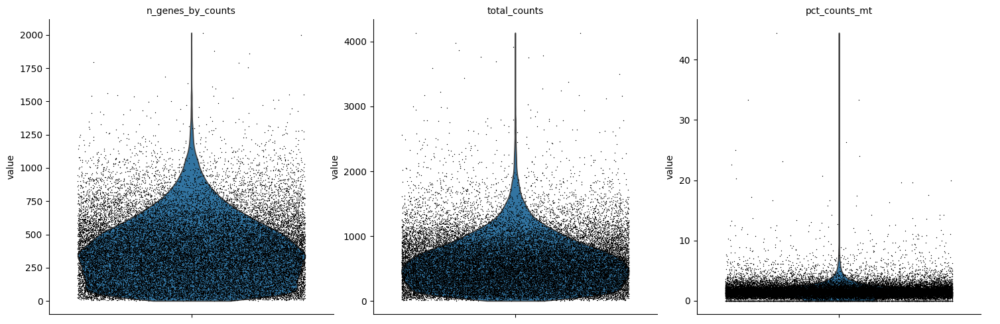

In [8]:
adata_vis.var["mt"] = adata_vis.var_names.str.startswith("mt-")
adata_vis.var["ribo"] = adata_vis.var_names.str.startswith(("Rps", "Rpl"))

sc.pp.calculate_qc_metrics(
    adata_vis, qc_vars=["mt", "ribo"], inplace=True, log1p=True
)
sc.pl.violin(
    adata_vis,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

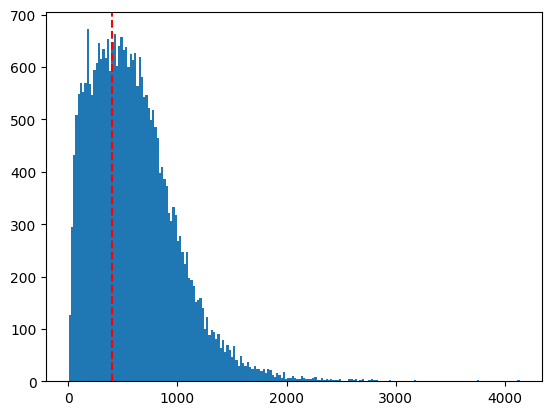

In [9]:
_ = plt.hist(adata_vis.obs['total_counts'], bins=200)
plt.axvline(x=400, color='red', linestyle='--')

In [10]:
sc.pp.filter_cells(adata_vis, min_genes=50)
# sc.pp.filter_genes(adata_vis, min_cells=15) # we're going to use slideseq genes

In [11]:
print(adata_vis.shape)
adata_vis = adata_vis[adata_vis.obs['total_counts'] > 400]
print(adata_vis.shape)

(28179, 19020)
(19209, 19020)


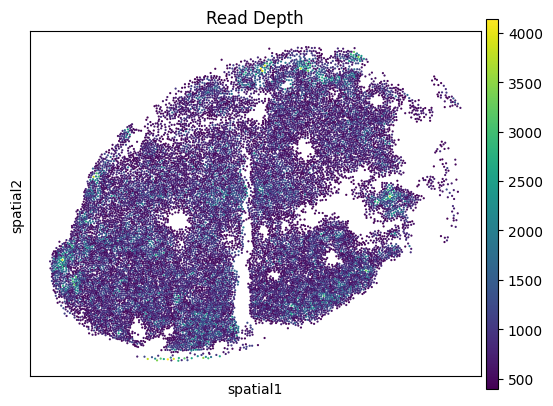

In [12]:
sc.pl.embedding(
    adata_vis,
    basis='spatial',
    color='total_counts',
    size=10,
    title='Read Depth',
    show=False
)
plt.gca().set_aspect('equal')


In [13]:
# Count cells with different marker combinations
ccr4_cells = adata_vis.obs_names[adata_vis[:, 'Ccr4'].X.toarray().flatten() > 0]
prdm1_cells = adata_vis.obs_names[adata_vis[:, 'Prdm1'].X.toarray().flatten() > 0]
ccr4_prdm1_cells = set(ccr4_cells) & set(prdm1_cells)
ccr4_neg_cells = set(adata_vis.obs_names) - set(ccr4_cells)
prdm1_only_cells = set(prdm1_cells) - set(ccr4_cells)

# Create dataframe with cell counts
cell_counts = pd.DataFrame({
    'Cell Type': ['Ccr4+', 'Ccr4-', 'Prdm1+', 'Ccr4+ Prdm1+', 'Ccr4- Prdm1+'],
    'Count': [len(ccr4_cells), len(ccr4_neg_cells), len(prdm1_cells), len(ccr4_prdm1_cells), len(prdm1_only_cells)]
})

# Display formatted dataframe
display(cell_counts)

,Cell Type,Count
0,Ccr4+,291
1,Ccr4-,18918
2,Prdm1+,305
3,Ccr4+ Prdm1+,7
4,Ccr4- Prdm1+,298


In [14]:
adata_vis[list(ccr4_prdm1_cells)]

View of AnnData object with n_obs × n_vars = 7 × 19020
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    obsm: 'spatial', 'spatial_unscaled'

### run_cell2loc.py